## Welcome to the text analysis tutorial 👋!

The **goals** of the tutorial are to

1. Understand the basics of text processing and the NLTK, Gensim, and spaCy libraries.
2. Explore topic modelling and its different flavours using TalTech paper abstracts from OpenAlex.
3. Train your own word embeddings using paper abstracts to discover themes and perform information retrieval.

#### Documentation

- [NLTK](https://www.nltk.org)
- [Gensim](https://radimrehurek.com/gensim/auto_examples/index.html#documentation)
- [spaCy](https://spacy.io/api/doc)
- [tomotopy](https://bab2min.github.io/tomotopy/v/en/)

#### Repos

- [Uncle Steve's Big List of Text Analytics and NLP Resources](https://github.com/stepthom/text_mining_resources)

#### Papers

- [Gentzkow M. et al. (2019) - Text as Data](https://www.aeaweb.org/articles?id=10.1257/jel.20181020)

#### Books

- [Jurafsky, D. and Martin, J. (2023) - Speech and Language Processing](https://web.stanford.edu/~jurafsky/slp3/)
- [Manning et al. (2008) - Introduction to Information Retrieval](https://nlp.stanford.edu/IR-book/information-retrieval-book.html)

In [1]:
import numpy as np
import pandas as pd

import altair as alt
import matplotlib.pyplot as plt
import seaborn as sns

from toolz import pipe
from typing import Dict, Sequence

from dap_taltech.utils.data_getters import DataGetter
from dap_taltech import logger

In [2]:
alt.data_transformers.enable('default', max_rows=None)
getter = DataGetter(local=True)
data = getter.get_taltech_articles()
data.dropna(subset=['abstract', 'cited_by_count', 'counts_by_year'], inplace=True)

2023-07-21 15:57:44,685 - TalTech HackWeek 2023 - INFO - Loading data from /home/ampudia19/projects/dap_taltech/data/ (data_getters.py:50)


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12042 entries, 0 to 13989
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   id                12042 non-null  object        
 1   display_name      12041 non-null  object        
 2   publication_date  12042 non-null  datetime64[ns]
 3   primary_location  11995 non-null  object        
 4   authorships       12042 non-null  object        
 5   cited_by_count    12042 non-null  int64         
 6   counts_by_year    12042 non-null  object        
 7   concepts          12042 non-null  object        
 8   abstract          12042 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(7)
memory usage: 940.8+ KB


In [4]:
data.head(2)

,id,display_name,publication_date,primary_location,authorships,cited_by_count,counts_by_year,concepts,abstract
0,W3103145119,SciPy 1.0: fundamental algorithms for scientif...,2020-02-03,"{'is_oa': True, 'landing_page_url': 'https://d...","[{'author': {'display_name': 'Pauli Virtanen',...",12676,"[{'cited_by_count': 2559, 'year': 2023}, {'cit...",[{'display_name': 'Python (programming languag...,SciPy is an open source scientific computing l...
1,W3099878876,Array programming with NumPy,2020-09-16,"{'is_oa': True, 'landing_page_url': 'https://d...",[{'author': {'display_name': 'Charles B. Harri...,7373,"[{'cited_by_count': 1649, 'year': 2023}, {'cit...",[{'display_name': 'Python (programming languag...,Abstract Array programming provides a powerful...


In [5]:
# Prepare the data for the first plot
publications_over_time = data['publication_date'].dt.year.value_counts().reset_index()
publications_over_time.columns = ['Year', 'Number of Publications']
publications_over_time = publications_over_time.sort_values('Year')

# Prepare the data for the second plot
citations = data['cited_by_count'].apply(lambda x: np.log10(x + 1)).reset_index()
citations.columns = ['index', 'Number of Citations (Log Scale)']

In [6]:
from utils import hist_plot
hist_plot(publications_over_time, citations, bins=30)

/home/ampudia19/anaconda3/envs/rvo/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


alt.HConcatChart(...)

In [7]:
# explode "counts_by_year" and extract a dataframe with columns id, year, count (the last two from the dictionary of the exploded reuslts)
counts_by_year = data.explode(column="counts_by_year")[["id", "display_name", "counts_by_year", "cited_by_count"]].dropna()

# select only if cited_by_count > 20
counts_by_year = counts_by_year[counts_by_year["cited_by_count"] > 20]

# rename cited_by_count to avoid confusion and log+1 scale it
counts_by_year = counts_by_year.rename(columns={"cited_by_count": "cited_by_count_total"})
# counts_by_year["cited_by_count_total"] = np.log10(counts_by_year["cited_by_count_total"] + 1)

# split "counts_by_year" into cited_by_count and year and transform them to int
counts_by_year = pd.concat([counts_by_year.drop(['counts_by_year'], axis=1), counts_by_year['counts_by_year'].apply(pd.Series)], axis=1)

# sort the data by id and year
counts_by_year = counts_by_year.sort_values(by=['id', 'year'])

# calculate the cumulative sum of citations per id per year
counts_by_year['cumulative_citations'] = counts_by_year.groupby(['id'])['cited_by_count'].cumsum()

# transform cited_by_count to log + 1 scale
# counts_by_year["cited_by_count"] = np.log10(counts_by_year["cited_by_count"] + 1)

# show head
counts_by_year.head(10)

,id,display_name,cited_by_count_total,cited_by_count,year,cumulative_citations
1701,W1074085140,Internationalization of Higher Education: Anal...,23,1,2016,1
1701,W1074085140,Internationalization of Higher Education: Anal...,23,1,2017,2
1701,W1074085140,Internationalization of Higher Education: Anal...,23,1,2018,3
1701,W1074085140,Internationalization of Higher Education: Anal...,23,4,2019,7
1701,W1074085140,Internationalization of Higher Education: Anal...,23,7,2020,14
1701,W1074085140,Internationalization of Higher Education: Anal...,23,2,2021,16
1701,W1074085140,Internationalization of Higher Education: Anal...,23,6,2022,22
1701,W1074085140,Internationalization of Higher Education: Anal...,23,1,2023,23
1629,W1176227036,The effect of tartaric acid in the deposition ...,24,4,2016,4
1629,W1176227036,The effect of tartaric acid in the deposition ...,24,4,2017,8


In [8]:
from utils import ts_citation_plot
ts_citation_plot(counts_by_year)

alt.HConcatChart(...)

In [9]:
def explode_and_normalise(data: pd.DataFrame, column: str, col_selection: Sequence[str], rename_dict: Dict[str, str]) -> pd.DataFrame:
    """Explode a column of a dataframe and extract a dataframe with columns id, display_name, concepts, cited_by_count, publication_date

    Args:
        data (pd.DataFrame): The dataframe to explode
        column (str): Column to explode
        col_selection (Sequence[str]): Sequence of columns to select
        rename_dict (Dict[str, str]): Rename dictionary

    Returns:
        pd.DataFrame: A dataframe with columns id, display_name, concepts, cited_by_count, publication_date
    """    

    data_exploded = data.explode(column=column)[col_selection].dropna().rename(columns=rename_dict).reset_index(drop=True)
    return pd.concat([data_exploded.drop([column], axis=1), pd.json_normalize(data_exploded[column])], axis=1)

concepts_by_year = explode_and_normalise(
    data=data, 
    column="concepts", 
    col_selection=["id", "display_name", "concepts", "cited_by_count", "publication_date"], 
    rename_dict={"display_name": "display_article_name", "id": "oa_id"}
)

# extract year variable, create total citations per year
concepts_by_year['year'] = concepts_by_year['publication_date'].dt.year
concepts_by_year['total_citations'] = concepts_by_year.groupby(['year'])['cited_by_count'].transform('sum')

# get proportion of display_name published in a given year
concepts_by_year['proportion'] = 1 / (1 + concepts_by_year['total_citations'])

# get a weighted proportion, moderated by the number of citations
concepts_by_year['weighted_proportion'] = concepts_by_year['cited_by_count'] / concepts_by_year['total_citations']

# create year and display_name groupbys, add proportion and weighted_proportion
concepts_by_year_grouped = concepts_by_year.groupby(['year', 'display_name']).agg({'proportion': 'sum', 'weighted_proportion': 'sum'}).reset_index()

# drop if proportion is one (single papers in year)
concepts_by_year_grouped = concepts_by_year_grouped[concepts_by_year_grouped['proportion'] != 1]

# show head
concepts_by_year.head(10)


,oa_id,display_article_name,cited_by_count,publication_date,display_name,id,level,score,wikidata,year,total_citations,proportion,weighted_proportion
0,W3103145119,SciPy 1.0: fundamental algorithms for scientif...,12676,2020-02-03,Python (programming language),https://openalex.org/C519991488,2,0.761894,https://www.wikidata.org/wiki/Q28865,2020,358609,0.000003,0.035348
1,W3103145119,SciPy 1.0: fundamental algorithms for scientif...,12676,2020-02-03,Computer science,https://openalex.org/C41008148,0,0.706398,https://www.wikidata.org/wiki/Q21198,2020,358609,0.000003,0.035348
2,W3103145119,SciPy 1.0: fundamental algorithms for scientif...,12676,2020-02-03,Cluster analysis,https://openalex.org/C73555534,2,0.432848,https://www.wikidata.org/wiki/Q622825,2020,358609,0.000003,0.035348
3,W3103145119,SciPy 1.0: fundamental algorithms for scientif...,12676,2020-02-03,Computational science,https://openalex.org/C459310,1,0.344604,https://www.wikidata.org/wiki/Q117801,2020,358609,0.000003,0.035348
4,W3103145119,SciPy 1.0: fundamental algorithms for scientif...,12676,2020-02-03,Algorithm,https://openalex.org/C11413529,1,0.342992,https://www.wikidata.org/wiki/Q8366,2020,358609,0.000003,0.035348
5,W3103145119,SciPy 1.0: fundamental algorithms for scientif...,12676,2020-02-03,Programming language,https://openalex.org/C199360897,1,0.256141,https://www.wikidata.org/wiki/Q9143,2020,358609,0.000003,0.035348
6,W3103145119,SciPy 1.0: fundamental algorithms for scientif...,12676,2020-02-03,Artificial intelligence,https://openalex.org/C154945302,1,0.182056,https://www.wikidata.org/wiki/Q11660,2020,358609,0.000003,0.035348
7,W3099878876,Array programming with NumPy,7373,2020-09-16,Python (programming language),https://openalex.org/C519991488,2,0.759996,https://www.wikidata.org/wiki/Q28865,2020,358609,0.000003,0.020560
8,W3099878876,Array programming with NumPy,7373,2020-09-16,Computer science,https://openalex.org/C41008148,0,0.623022,https://www.wikidata.org/wiki/Q21198,2020,358609,0.000003,0.020560
9,W3099878876,Array programming with NumPy,7373,2020-09-16,Interoperability,https://openalex.org/C20136886,2,0.572778,https://www.wikidata.org/wiki/Q749647,2020,358609,0.000003,0.020560


In [10]:
from utils import ts_proportion_plot
ts_proportion_plot(concepts_by_year_grouped)

alt.HConcatChart(...)

In [11]:
# Get counts of concepts
concept_counts = pipe(
    concepts_by_year.groupby(['display_name']).agg({'year': 'count'}).reset_index().rename(columns={"year": "count"}),
    lambda df: df.sort_values(by=['count'], ascending=False).head(500).reset_index(drop=True)
)

In [12]:
from utils import clusters_keywords_plot
clusters_keywords_plot(concept_counts)

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_layer_norm.bias', 'vocab_projector.weight', 'vocab_layer_norm.weight', 'vocab_transform.bias', 'vocab_transform.weight', 'vocab_projector.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


alt.Chart(...)

In [13]:
# explode "authorships" and extract a dataframe with columns id, display_name, authorships, cited_by_count, publication_date
authors = explode_and_normalise(
    data=data,
    column="authorships",
    col_selection=["id", "display_name", "authorships", "cited_by_count", "publication_date"],
    rename_dict={"display_name": "display_article_name", "id": "oa_id"}
)

# explode again for nested institutions
authors = explode_and_normalise(
    data=authors,
    column="institutions",
    col_selection=[
        "oa_id", "display_article_name", "cited_by_count", "publication_date",
        "author.display_name", "raw_affiliation_string", "institutions"
    ],
    rename_dict={"author.display_name": "author_name"}
)

# select authors with Tallin University of Technology ID "https://openalex.org/I111112146"
authors = authors[authors["id"] == "https://openalex.org/I111112146"]

# add cumulative citation count 
authors['cumulative_citations'] = authors.sort_values(by=["author_name", "publication_date"]).groupby('author_name')['cited_by_count'].cumsum() + 1

# create a copy of the dataframe to calculate proportions
authors_by_year = authors.copy()

# extract year variable, create total citations per year
authors_by_year['year'] = authors_by_year['publication_date'].dt.year
authors_by_year['total_citations'] = authors_by_year.groupby(['year'])['cited_by_count'].transform('sum')

# get proportion of display_name published in a given year
authors_by_year['proportion'] = 1 / (1 + authors_by_year['total_citations'])

# get a weighted proportion, moderated by the number of citations
authors_by_year['weighted_proportion'] = authors_by_year['cited_by_count'] / authors_by_year['total_citations']

# create year and display_name groupbys, add proportion and weighted_proportion
authors_by_year = authors_by_year.groupby(['year', 'author_name']).agg({'proportion': 'sum', 'weighted_proportion': 'sum'}).reset_index()

# drop if proportion is one (single papers in year)
authors_by_year = authors_by_year[authors_by_year['proportion'] != 1]

authors.head(5)

,oa_id,display_article_name,cited_by_count,publication_date,author_name,raw_affiliation_string,country_code,display_name,id,ror,type,cumulative_citations
12,W3103145119,SciPy 1.0: fundamental algorithms for scientif...,12676,2020-02-03,Pearu Peterson,"Independent researcher, Saue, Estonia; Departm...",EE,Tallinn University of Technology,https://openalex.org/I111112146,https://ror.org/0443cwa12,education,12933
45,W3103145119,SciPy 1.0: fundamental algorithms for scientif...,12676,2020-02-03,Stefan Peterson,"Independent researcher, Saue, Estonia; Departm...",EE,Tallinn University of Technology,https://openalex.org/I111112146,https://ror.org/0443cwa12,education,12677
69,W3099878876,Array programming with NumPy,7373,2020-09-16,Pearu Peterson,"Independent researcher, Saue, Estonia; Departm...",EE,Tallinn University of Technology,https://openalex.org/I111112146,https://ror.org/0443cwa12,education,20306
100,W2167557672,2013 ESH/ESC Guidelines for the management of ...,4196,2013-07-01,Margus Viigimaa,Tallinn University of Technology#TAB#,EE,Tallinn University of Technology,https://openalex.org/I111112146,https://ror.org/0443cwa12,education,4752
105,W2049136420,"Toxicity of Ag, CuO and ZnO nanoparticles to s...",944,2013-06-01,Katre Juganson,"Laboratory of Environmental Toxicology, Nation...",EE,Tallinn University of Technology,https://openalex.org/I111112146,https://ror.org/0443cwa12,education,999


In [14]:
from utils import ts_authors_plot
ts_authors_plot(authors, authors_by_year)

alt.HConcatChart(...)

In [15]:
authors.author_name.value_counts().head(10)

author_name
Dmitri Vinnikov     351
Toomas Vaimann      239
Jaan Raik           209
Raimund Ubar        208
Ants Kallaste       198
Anton Rassolkin     177
Andrii Chub         170
Irina Hussainova    164
Eduard Petlenkov    161
Jarek Kurnitski     152
Name: count, dtype: int64

In [18]:
# show the ten authors with highest maximum cumulative citation count
(
    authors
    .groupby(['author_name'])
    .agg({'cumulative_citations': 'max'})
    .sort_values(by=['cumulative_citations'], ascending=False)
    .head(10)
)

,cumulative_citations
author_name,
Pearu Peterson,20306
Stefan Peterson,12677
Margus Viigimaa,6575
Vijai Kumar Gupta,4183
Jarek Kurnitski,3523
Dmitri Vinnikov,3108
Malle Krunks,2933
Irina Hussainova,2805
Jüri Krustok,2635


In [21]:
# sum display_name cited_by_counts for concepts_per_year and show top 10
(
    concepts_by_year
    .groupby(['display_name'])
    .agg({'cited_by_count': 'sum'})
    .sort_values(by=['cited_by_count'], ascending=False)
    .head(10)
)

,cited_by_count
display_name,
Computer science,69572
Engineering,52468
Biology,51640
Chemistry,50644
Physics,39266
Materials science,35876
Artificial intelligence,34886
Organic chemistry,31687
Programming language,30727


In [28]:
# do the same but with a breakdwon by year
(
    concepts_by_year
    .groupby(['year', 'display_name'])
    .agg({'cited_by_count': 'sum'})
    .sort_values(by=['year', 'cited_by_count'], ascending=False)
    .groupby('year')
    .head(10)
    .reset_index()
    .assign(top_number=lambda df: df.groupby('year').cumcount() + 1)
    .pivot(columns='year', index='top_number', values='display_name')
)

year,1970,1980,1981,1982,1983,1984,1987,1989,1990,1991,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
top_number,,,,,,,,,,,,,,,,,,,,,
1,Engineering,Arithmetic,Analytical Chemistry (journal),Analytical Chemistry (journal),Materials science,Citation,Acoustics,Chemistry,Physics,Chemistry,...,Engineering,Engineering,Engineering,Engineering,Computer science,Engineering,Computer science,Computer science,Computer science,Engineering
2,Materials science,Automation,Cadmium,Atomic physics,Optoelectronics,Computer science,Aperture (computer memory),Organic chemistry,Engineering,Acoustics,...,Computer science,Computer science,Computer science,Biology,Biology,Biology,Programming language,Engineering,Engineering,Computer science
3,Cellulose,Chemical plant,Chemistry,Biochemistry,Physics,Engineering physics,Beam (structure),Physics,Chemistry,Analytical Chemistry (journal),...,Chemistry,Chemistry,Biology,Computer science,Engineering,Computer science,Artificial intelligence,Materials science,Physics,Materials science
4,Chemical engineering,Computer science,Chromatography,Chemistry,Analytical Chemistry (journal),Library science,Citation,Thermodynamics,Mineralogy,Cadmium telluride photovoltaics,...,Biology,Physics,Physics,Chemistry,Chemistry,Chemistry,Python (programming language),Biology,Materials science,Chemistry
5,Composite material,Control engineering,Conductivity,Copper,Astronomy,Physics,Computer science,Benzoic acid,Organic chemistry,Chromatography,...,Physics,Biology,Chemistry,Physics,Physics,Materials science,Computational science,Physics,Biology,Physics
6,Composite number,Division (mathematics),Copper,Emission intensity,Atmospheric temperature range,NaN,Gaussian,Calorimetry,Thermodynamics,Condensed matter physics,...,Environmental science,Materials science,Materials science,Biochemistry,Economics,Physics,Algorithm,Chemistry,Chemistry,Composite material
7,Compression molding,Engineering,Crystallographic defect,Environmental chemistry,Band diagram,NaN,Gaussian beam,Cyclodextrin,Artificial intelligence,Crystallography,...,Materials science,Mathematics,Geology,Economics,Materials science,Business,Cluster analysis,Business,Electrical engineering,Biology
8,Dynamic mechanical analysis,Environmental engineering,Crystallography,Gene,Chemistry,NaN,Optics,Inclusion (mineral),Computer science,Doping,...,Economics,Organic chemistry,Organic chemistry,Organic chemistry,Environmental science,Organic chemistry,Data science,Medicine,Artificial intelligence,Electrical engineering
9,Low-density polyethylene,Mathematical model,Electrical engineering,Intensity (physics),Chromatography,NaN,Physics,Inclusion compound,Quantum mechanics,Hexagonal crystal system,...,Quantum mechanics,Quantum mechanics,Mathematics,Materials science,Organic chemistry,Composite material,World Wide Web,Electrical engineering,Medicine,Organic chemistry


## Overview of the Python ecosystem for text analysis

# TODO: Don't do this, instead just focus on NLTK for very basics, spacy for POS and NERs. Move onto next things.

We will delve into some of the most popular and widely-used libraries and frameworks in Python, including Gensim, spaCy, NLTK, and scikit-learn. Each of these libraries brings unique capabilities and functionalities to the table, enabling us to perform a wide range of text analsis tasks efficiently.

In [84]:
text = data.abstract[0]

#### NLTK
A powerful library for NLP in Python. It provides a wide range of functionalities for text analysis.

In [89]:
import nltk

# Downloading necessary NLTK resources (you can also download all resources using nltk.download('all'))
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('vader_lexicon')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /home/ampudia19/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ampudia19/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/ampudia19/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/ampudia19/nltk_data...


True

##### Text pre-processing

In [90]:
## Tokenisation

from nltk.tokenize import word_tokenize, sent_tokenize

# Tokenize into words
words = word_tokenize(text)
print("Tokenized words:")
print(words)

# Tokenize into sentences
sentences = sent_tokenize(text)
print("\nTokenized sentences:")
print(sentences)

## Stopwords

from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
filtered_words = [word for word in words if word.lower() not in stop_words]
print("\nWords after stopword removal:")
print(filtered_words)

## Stemming and Lemmatisation

from nltk.stem import PorterStemmer, WordNetLemmatizer

# Stemming
stemmer = PorterStemmer()
stemmed_words = [stemmer.stem(word) for word in words]
print("\nStemmed words:")
print(stemmed_words)

# Lemmatization
lemmatizer = WordNetLemmatizer()
lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
print("\nLemmatized words:")
print(lemmatized_words)

## Word frequency analysis

from nltk.probability import FreqDist

# Calculate word frequencies
freq_dist = FreqDist(words)
print("\nWord Frequencies:")
print(freq_dist.most_common())

## Sentiment analysis

from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Example text for sentiment analysis
text_sentiment = "I love this product! It's amazing."

# Initialize the VADER SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

# Get sentiment scores
sentiment_scores = analyzer.polarity_scores(text_sentiment)

# Print sentiment scores
print("\nSentiment Analysis:")
print(sentiment_scores)

Tokenized words:
['SciPy', 'is', 'an', 'open', 'source', 'scientific', 'computing', 'library', 'for', 'the', 'Python', 'programming', 'language', '.', 'SciPy', '1.0', 'was', 'released', 'in', 'late', '2017', ',', 'about', '16', 'years', 'after', 'the', 'original', 'version', '0.1', 'release', '.', 'SciPy', 'has', 'become', 'a', 'de', 'facto', 'standard', 'for', 'leveraging', 'scientific', 'algorithms', 'in', 'the', 'Python', 'programming', 'language', ',', 'with', 'more', 'than', '600', 'unique', 'code', 'contributors', ',', 'thousands', 'of', 'dependent', 'packages', ',', 'over', '100,000', 'dependent', 'repositories', ',', 'and', 'millions', 'of', 'downloads', 'per', 'year', '.', 'This', 'includes', 'usage', 'of', 'SciPy', 'in', 'almost', 'half', 'of', 'all', 'machine', 'learning', 'projects', 'on', 'GitHub', ',', 'and', 'usage', 'by', 'high', 'profile', 'projects', 'including', 'LIGO', 'gravitational', 'wave', 'analysis', 'and', 'creation', 'of', 'the', 'first-ever', 'image', 'of', 

#### Gensim

In [102]:
import gensim
from gensim.models import Word2Vec, Doc2Vec, LdaModel
from gensim.models.doc2vec import TaggedDocument

# Tokenize the text into words
words = gensim.utils.simple_preprocess(text)

# Train Word2Vec model
model_w2v = Word2Vec([words], vector_size=100, window=5, min_count=1, sg=0)

# Get word embeddings
word_embeddings = model_w2v.wv

# Find similar words to a given word
similar_words = word_embeddings.most_similar("language", topn=5)
print("Similar words to 'language':")
print(similar_words)

# Example corpus
corpus = data.abstract.iloc[-10:]

# Sample documents for training
documents = [TaggedDocument(words=gensim.utils.simple_preprocess(text), tags=[str(i)]) for i, text in enumerate(corpus)]

# Train Doc2Vec model
model_d2v = Doc2Vec(documents, vector_size=100, window=5, min_count=1, workers=4)

# Get document embeddings
doc_embeddings = model_d2v.dv

# Find the most similar document to a given document
similar_document = model_d2v.dv.most_similar('0', topn=1)
print("\nMost similar document to Document 0:")
print(similar_document)

# Preprocess the corpus into tokens
corpus_tokens = [gensim.utils.simple_preprocess(doc) for doc in corpus]

# Create a dictionary from the corpus
dictionary = gensim.corpora.Dictionary(corpus_tokens)

# Convert the corpus into bag-of-words (BoW) representation
corpus_bow = [dictionary.doc2bow(tokens) for tokens in corpus_tokens]

# Train LDA model
model_lda = LdaModel(corpus_bow, num_topics=2, id2word=dictionary, passes=10, random_state=42)

# Print the topics and their corresponding words
print("\nLDA Topics:")
topics = model_lda.print_topics(num_words=5)
for topic in topics:
    print(topic)

# remove stopwords
from gensim.parsing.preprocessing import STOPWORDS
corpus_tokens = [[word for word in doc if word not in STOPWORDS] for doc in corpus_tokens]

corpus_bow = [dictionary.doc2bow(tokens) for tokens in corpus_tokens]
model_lda = LdaModel(corpus_bow, num_topics=2, id2word=dictionary, passes=10, random_state=42)

print("\nLDA Topics:")
topics = model_lda.print_topics(num_words=5)
for topic in topics:
    print(topic)

Similar words to 'language':
[('signal', 0.2629912793636322), ('scientific', 0.24745416641235352), ('orthogonal', 0.1964474320411682), ('version', 0.19061578810214996), ('github', 0.18955619633197784)]

Most similar document to Document 0:
[('1', 0.7343369722366333)]

LDA Topics:
(0, '0.059*"the" + 0.042*"of" + 0.021*"and" + 0.020*"in" + 0.014*"to"')
(1, '0.016*"the" + 0.016*"and" + 0.016*"in" + 0.014*"design" + 0.014*"to"')

LDA Topics:
(0, '0.009*"results" + 0.008*"paper" + 0.008*"locomotion" + 0.008*"arousal" + 0.008*"level"')
(1, '0.010*"design" + 0.008*"paper" + 0.007*"robot" + 0.007*"code" + 0.007*"sea"')


### spaCy
Arguably the leading library for advanced natural language processing in Python, providing state-of-the-art tools for tokenisation, part-of-speech tagging, named entity recognition, dependency parsing, and more.

In [49]:
import spacy
nlp = spacy.load("en_core_web_sm")

text = nlp(data['abstract'].iloc[0])
text

SciPy is an open source scientific computing library for the Python programming language. SciPy 1.0 was released in late 2017, about 16 years after the original version 0.1 release. SciPy has become a de facto standard for leveraging scientific algorithms in the Python programming language, with more than 600 unique code contributors, thousands of dependent packages, over 100,000 dependent repositories, and millions of downloads per year. This includes usage of SciPy in almost half of all machine learning projects on GitHub, and usage by high profile projects including LIGO gravitational wave analysis and creation of the first-ever image of a black hole (M87). The library includes functionality spanning clustering, Fourier transforms, integration, interpolation, file I/O, linear algebra, image processing, orthogonal distance regression, minimization algorithms, signal processing, sparse matrix handling, computational geometry, and statistics. In this work, we provide an overview of the

In [50]:
for token in text[:20]:
    print(f"{token.text} - {token.pos_} - {token.dep_}")

SciPy - PROPN - nsubj
is - AUX - ROOT
an - DET - det
open - ADJ - amod
source - NOUN - nmod
scientific - ADJ - amod
computing - NOUN - compound
library - NOUN - attr
for - ADP - prep
the - DET - det
Python - PROPN - compound
programming - NOUN - compound
language - NOUN - pobj
. - PUNCT - punct
SciPy - PROPN - nsubjpass
1.0 - NUM - nummod
was - AUX - auxpass
released - VERB - ROOT
in - ADP - prep
late - ADJ - amod


In [51]:
# remove punctuation and stop words
[token.text for token in text if not token.is_punct and not token.is_stop][:20]

['SciPy',
 'open',
 'source',
 'scientific',
 'computing',
 'library',
 'Python',
 'programming',
 'language',
 'SciPy',
 '1.0',
 'released',
 'late',
 '2017',
 '16',
 'years',
 'original',
 'version',
 '0.1',
 'release']

In [103]:
## Named Entity Recognition (NER)

# Process the text with spaCy
doc_ner = nlp(text)

# Named Entity Recognition
entities = [(entity.text, entity.label_) for entity in doc_ner.ents]
print("\nNamed Entities:")
print(entities)


Named Entities:
[('SciPy', 'PERSON'), ('SciPy 1.0', 'PRODUCT'), ('late 2017', 'DATE'), ('about 16 years', 'DATE'), ('0.1', 'CARDINAL'), ('SciPy', 'PERSON'), ('more than 600', 'CARDINAL'), ('thousands', 'CARDINAL'), ('100,000', 'CARDINAL'), ('millions', 'CARDINAL'), ('SciPy', 'PRODUCT'), ('almost half', 'CARDINAL'), ('GitHub', 'ORG'), ('LIGO', 'ORG'), ('first', 'ORDINAL'), ('M87', 'WORK_OF_ART'), ('Fourier', 'PERSON'), ('linear', 'ORG'), ('SciPy', 'PRODUCT')]


In [105]:
# Process the text with spaCy
doc_dependency = nlp(text)

# Dependency Parsing
dependency_tree = [(token.text, token.dep_, token.head.text) for token in doc_dependency]
print("\nDependency Parsing:")
print(dependency_tree)



Dependency Parsing:
[('SciPy', 'nsubj', 'is'), ('is', 'ROOT', 'is'), ('an', 'det', 'library'), ('open', 'amod', 'source'), ('source', 'nmod', 'library'), ('scientific', 'amod', 'library'), ('computing', 'compound', 'library'), ('library', 'attr', 'is'), ('for', 'prep', 'library'), ('the', 'det', 'language'), ('Python', 'compound', 'language'), ('programming', 'compound', 'language'), ('language', 'pobj', 'for'), ('.', 'punct', 'is'), ('SciPy', 'nsubjpass', 'released'), ('1.0', 'nummod', 'SciPy'), ('was', 'auxpass', 'released'), ('released', 'ROOT', 'released'), ('in', 'prep', 'released'), ('late', 'amod', '2017'), ('2017', 'pobj', 'in'), (',', 'punct', 'released'), ('about', 'advmod', '16'), ('16', 'nummod', 'years'), ('years', 'npadvmod', 'after'), ('after', 'prep', 'released'), ('the', 'det', 'release'), ('original', 'amod', 'release'), ('version', 'nmod', 'release'), ('0.1', 'nummod', 'release'), ('release', 'pobj', 'after'), ('.', 'punct', 'released'), ('SciPy', 'nsubj', 'become')

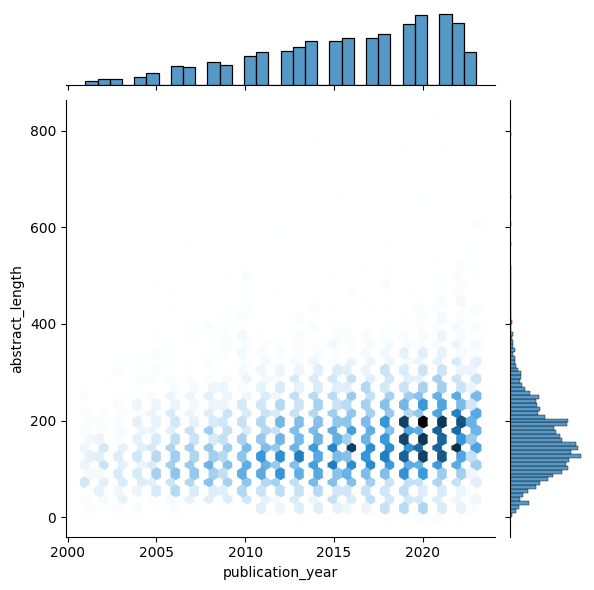

In [75]:
# get publication year
data['publication_year'] = data['publication_date'].dt.year

# compare abstract length and year of publication
sns.jointplot(
    x='publication_year', 
    y='abstract_length', 
    data=data.loc[(data['publication_year'] > 2000) & (data['abstract_length'] < 1000)],
    kind='hex'
)

In [ ]:
# finish huggingface and scikit-learn

In [ ]:
## Pre-processing Text data
# Removing special characters, punctuation, and numbers
# Converting text to lower case and handling capitalisation
# Tokenisation: splitting text into words or phrases
# Stopword removal: eliminating common words with little meaning
# Stemming & Lemmatising: reducing words to their base or root form

## Exploratory text-analysis 
# Word frequency analysis: most frequent words
# n-grams: analysing sequences of words
# Word clouds and visualisation of text data
# Sentiment analysis and dictionary methods

## Advanced text-analysis
# TF-IDF: feature extraction
# Topic modelling: discover hidden topics
# NERs: identifying and classifying entities in the text
# Text classification: supervised leraning techniques for categorising text